# Test der erweiterten Wasserscheidensegmentierung um Objekte zu erzeugen

Das Hystereseschwellwertverfahren funktioniert zwar einigermaßen, aber die Wahl der Schwellwert ist relativ willkürlich. Ein weiterer Ansatz ist die Wasserscheidensegmentierung mit einer Erweiterung um einen Hystereseansatz, wie in Lakshmanan (2009) oder in Najman & Schmitt (1996). In diesem Skript wird versucht, ob es möglich ist, das auch mit Pythonmitteln durchzuführen. 

Dafür müssen wir zunächst ein paar nötige Pakete laden.

In [11]:
%matplotlib inline

import numpy as np
import scipy.ndimage as ndi
from scipy import special as sp_spec
from skimage import morphology as skmor
import datetime as dt

import l15_msevi.msevi as msv
from analysis_tools import segmentation as sgm

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

Zunächst laden wir uns ein paar Satellitendaten.

In [12]:
time = dt.datetime(2012,7,28,11,0)

s = msv.MSevi(time=time,chan_list=['IR_108','WV_062','WV_073','IR_016','IR_039','VIS006','HRV'])
s.lonlat()
s.rad2bt()
s.rad2refl()

Region suggests use of hdf file


In [13]:
vis006_data = s.ref['VIS006']
ir016_data = s.ref['IR_016']
ir039_data = s.bt['IR_039']
ir108_data = s.bt['IR_108']
wv062_data = s.bt['WV_062']
wv073_data = s.bt['WV_073']
hrv_data = s.ref['HRV']

Und dann laden wir noch die Wolkenmaske.

In [14]:
cma = msv.MSGtools.get_nwcsaf_prod('CMa',time,calibrate=True)

Für die Wasserscheidensegmentierung benötigen wir als Startpunkte ein paar Markierungen. Für den IR108-Kanal bieten sich die lokalen Minima und für den HRV-Kanal lokale Maxima an.

Um das Ganze etwas glatter zu gestalten, bietet es sich auch an die Felder zu glätten und eventuell, wie in Lakshmanan (2009) zu diskretisieren. Dafür definieren wir jetzt Funktionen.

In [15]:
def quantise_field(field,lower_limit,upper_limit,delta):
    """
    Quantises a given array into discrete steps within given limits and step width.
    
    Parameters
    ----------
    field: numpy array, 2d
        array to quantise
    limit1: float
        first limit for the quantisation
    limit2: float
        second limit for the quantisation
    delta: float
        width of the quantisation steps, if delta > 0 the quantisation will be based on the field maxima and if it
        it < 0 on the field minima
    """
    
    quant = np.zeros_like(field)
    
    too_small = np.where(field <= lower_limit)
    too_large = np.where(field > upper_limit)
    right = np.where(np.logical_and(field > lower_limit,field <= upper_limit) )
    
    if delta < 0:
        quant[too_small] = np.rint((lower_limit-upper_limit)/delta)
        quant[too_large] = 0
        quant[right] = np.rint((field[right] - upper_limit) / delta)
        
        return quant
    elif delta > 0:
        quant[too_large] = np.rint((upper_limit-lower_limit)/delta)
        quant[too_small] = 0
        quant[right] = np.rint((field[right] - lower_limit) / delta)
        
        return quant
    else:
        print("Impossible combination. If limit1 > limit2, delta has to be < 0 and if limit1 < limit2, delta has to be negative.")
        return
    
def find_local_minima(field,minimum_depth=10,lower_threshold=253,upper_threshold=273,sigma=1):
    feld_glatt = ndi.gaussian_filter(field,sigma)

    feld_glatt_maskiert = feld_glatt.copy()
    feld_glatt_maskiert[feld_glatt_maskiert > upper_threshold] = np.max(feld_glatt_maskiert)
    feld_glatt_maskiert[feld_glatt_maskiert < lower_threshold] = np.max(feld_glatt_maskiert)

    minima_h = extrema.h_minima(feld_glatt_maskiert,minimum_depth)

    label_minima_h = label(minima_h)

    return np.ma.masked_where(label_minima_h==0,label_minima_h)

def find_local_maxima(field,maximum_depth=0.3,lower_threshold=0,upper_threshold=0.5,sigma=1):
    feld_glatt = ndi.gaussian_filter(field,sigma)

    feld_glatt_maskiert = feld_glatt.copy()
    feld_glatt_maskiert[feld_glatt_maskiert > upper_threshold] = np.min(feld_glatt_maskiert)
    feld_glatt_maskiert[feld_glatt_maskiert < lower_threshold] = np.min(feld_glatt_maskiert)

    maxima_h = extrema.h_maxima(feld_glatt_maskiert,maximum_depth)

    label_maxima_h = label(maxima_h)

    return np.ma.masked_where(label_maxima_h==0,label_maxima_h)

Als nächstes glätten wir die Felder.

In [16]:
def gauss_sigma(N):
    sigma = 2**N / (sp_spec.binom(N,N/2.)*np.pi)
    
    return sigma

In [17]:
ir108_smoothed = ndi.gaussian_filter(ir108_data,gauss_sigma(float(np.min(ir108_data.shape)/8)))
hrv_smoothed = ndi.gaussian_filter(hrv_data,gauss_sigma(float(np.min(hrv_data.shape)/8)))

Text(0,0.5,u'latitude / \xb0N')

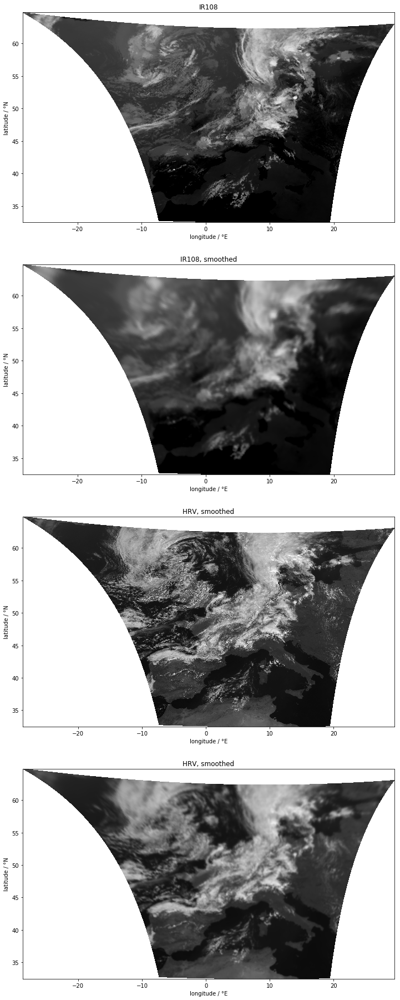

In [18]:
fig, ax = plt.subplots(4,1,figsize=(12,32))
ax[0].pcolormesh(s.lon,s.lat,ir108_data,vmin=210,vmax=300,cmap='gray_r')
ax[0].set_title("IR108")
ax[0].set_xlabel(u"longitude / °E")
ax[0].set_ylabel(u"latitude / °N")

ax[1].pcolormesh(s.lon,s.lat,ir108_smoothed,vmin=210,vmax=300,cmap='gray_r')
ax[1].set_title("IR108, smoothed")
ax[1].set_xlabel(u"longitude / °E")
ax[1].set_ylabel(u"latitude / °N")

ax[2].pcolormesh(s.hlon,s.hlat,np.clip(hrv_data,0,1),vmin=0,vmax=1,cmap='gray')
ax[2].set_title("HRV, smoothed")
ax[2].set_xlabel(u"longitude / °E")
ax[2].set_ylabel(u"latitude / °N")

ax[3].pcolormesh(s.hlon,s.hlat,np.clip(hrv_smoothed,0,1),vmin=0,vmax=1,cmap='gray')
ax[3].set_title("HRV, smoothed")
ax[3].set_xlabel(u"longitude / °E")
ax[3].set_ylabel(u"latitude / °N")

Als nächstes suchen wir uns die Markierungen, von denen wir aus die Flutung anfangen lassen. 

In [19]:
ir_mins = skmor.h_minima(ir108_smoothed,4)
hrv_maxs = skmor.h_maxima(hrv_smoothed,0.3)

Text(0.5,1,'HRV Maxima')

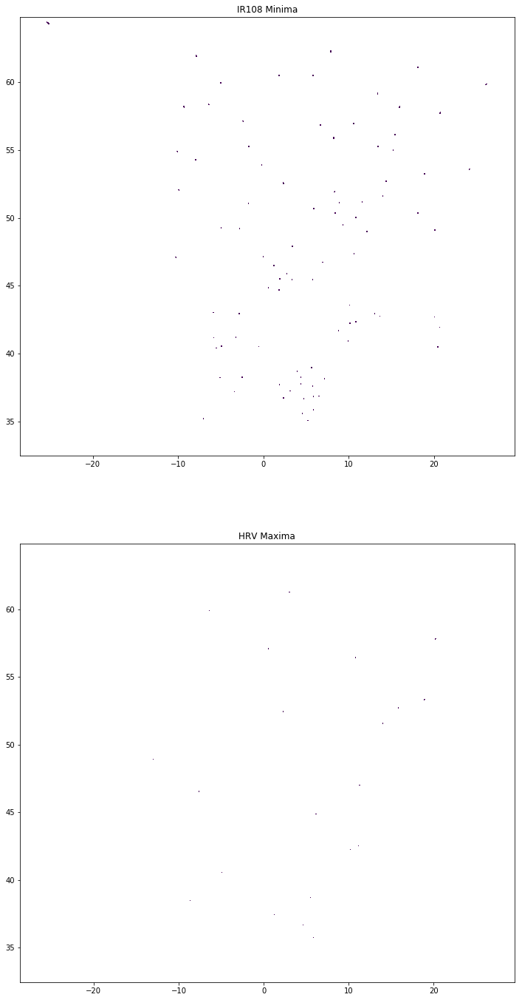

In [20]:
fig,ax = plt.subplots(2,1,figsize=(12,24))
ax[0].pcolormesh(s.lon,s.lat,np.ma.masked_less(ir_mins,1))
ax[0].set_title("IR108 Minima")
ax[1].pcolormesh(s.hlon,s.hlat,np.ma.masked_less(hrv_maxs,1))
ax[1].set_title("HRV Maxima")

Um die Wasserscheidensegmentierung zu begrenzen, werden die zu segmentierenden Felder quantisiert.

In [21]:
ir108_mask = ir108_smoothed.copy()
ir108_mask[cma==1] = np.max(ir108_mask)


ir108_quant = quantise_field(ir108_mask,220,270,-5)
hrv_quant = quantise_field(hrv_smoothed,0.3,1,0.1)

In [22]:
def colorbar(mappable):
    ax = mappable.axes
    fig = ax.figure
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    return fig.colorbar(mappable, cax=cax)

Text(0.5,1,'HRV quantisiert')

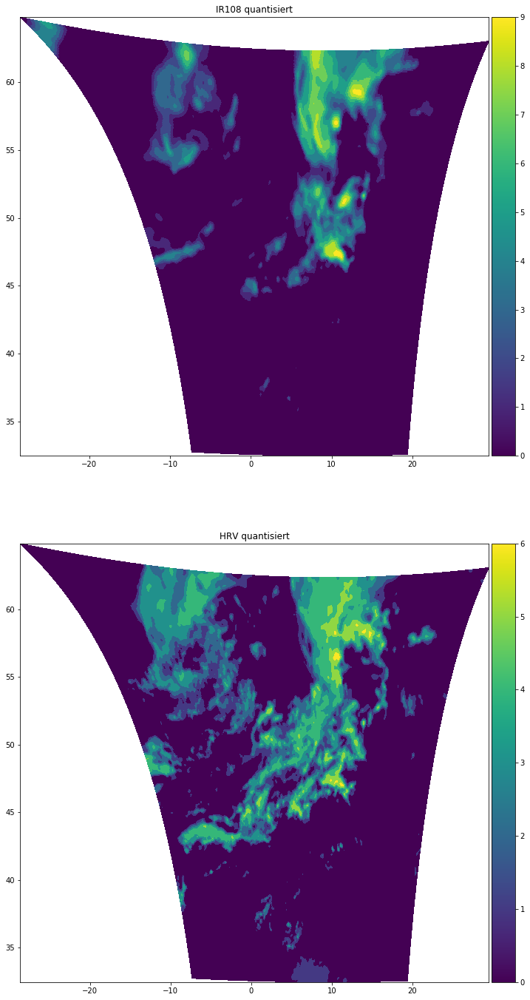

In [23]:
fig,ax = plt.subplots(2,1,figsize=(12,24))
ir_plot = ax[0].pcolormesh(s.lon,s.lat,ir108_quant)
colorbar(ir_plot)
ax[0].set_title("IR108 quantisiert")
hrv_plot = ax[1].pcolormesh(s.hlon,s.hlat,hrv_quant)
colorbar(hrv_plot)
ax[1].set_title("HRV quantisiert")

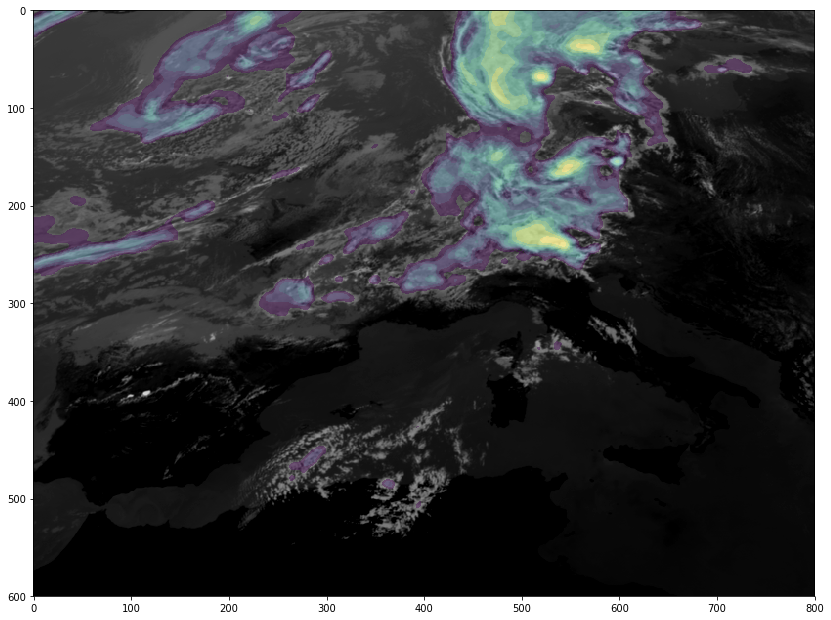

In [24]:
fig,ax = plt.subplots(1,1,figsize=(14,12))
ax.imshow(ir108_data,vmin=210,vmax=300,cmap='gray_r')
ax.imshow(np.ma.masked_less(ir108_quant,1),alpha=0.4)

In [25]:
ir_marker = skmor.h_maxima(ir108_quant,4)

In [26]:
ir108_seg = skmor.watershed(-ir108_quant,ndi.label(ir_marker)[0],mask=np.ma.masked_greater(ir108_quant,0))

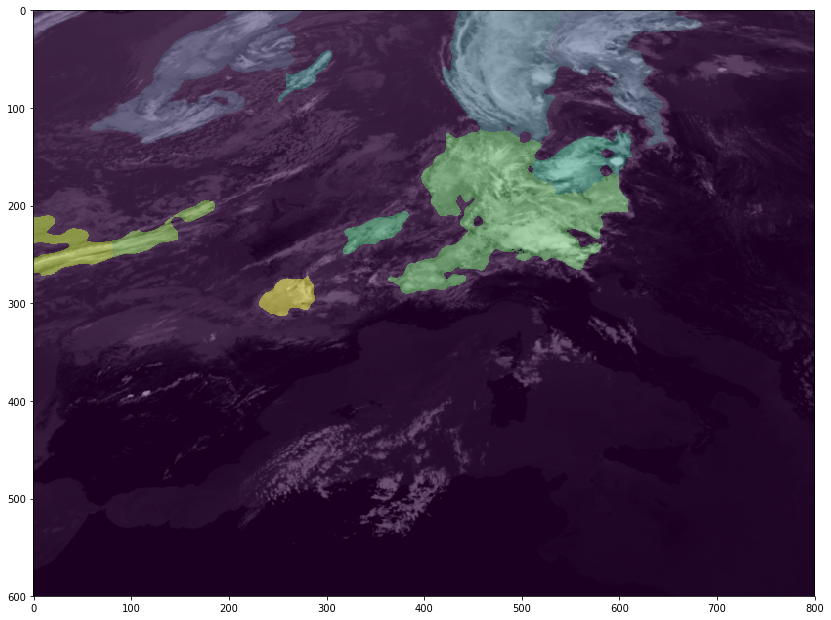

In [27]:
fig,ax = plt.subplots(1,1,figsize=(14,12))
ax.imshow(ir108_data,vmin=210,vmax=300,cmap='gray_r')
ax.imshow(ir108_seg,alpha=0.4)

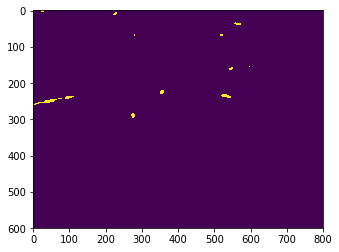

In [28]:
plt.imshow(ir_marker)

In [29]:
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.filters import sobel

In [30]:
img = ir108_smoothed
img[img>270] = 0
segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
segments_slic = slic(img, n_segments=250, compactness=10, sigma=1)
#segments_quick = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)
gradient = sobel(img)
segments_watershed = watershed(gradient, markers=250, compactness=0.001)

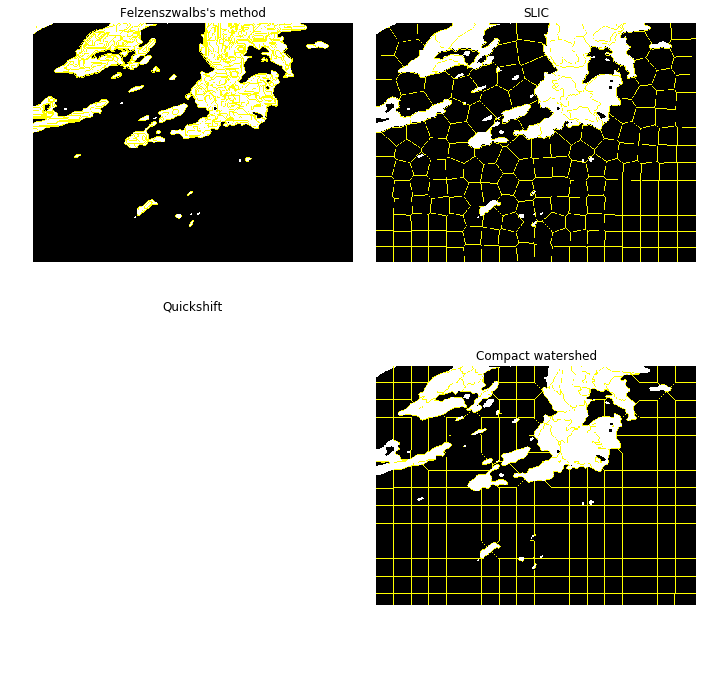

In [31]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)

ax[0, 0].imshow(mark_boundaries(img, segments_fz))
ax[0, 0].set_title("Felzenszwalbs's method")
ax[0, 1].imshow(mark_boundaries(img, segments_slic))
ax[0, 1].set_title('SLIC')
#ax[1, 0].imshow(mark_boundaries(img, segments_quick))
ax[1, 0].set_title('Quickshift')
ax[1, 1].imshow(mark_boundaries(img, segments_watershed))
ax[1, 1].set_title('Compact watershed')

for a in ax.ravel():
    a.set_axis_off()

plt.tight_layout()
plt.show()

In [32]:
def scale_array_min_max(array_data):
    """
    Scales a array into the range of [0,1] using the minimum and maximum value
    of the array.
    
    Inputs:
    -------
    array_data: numpy array of floats or integers, 2d
        array to scale
        
    Returns:
    --------
    scaled_array: numpy array of floats, 2d
    """

    # determine extremes of the given field
    array_min = np.nanmin(array_data)
    array_max = np.nanmax(array_data)

    # scale array
    scaled_array = (array_data - array_min) / (array_max - array_min)
    
    return scaled_array

def scale_array(array_data,array_min,array_max):
    """
    Scales a array into the range of [0,1] using the minimum and maximum value
    of the array.
    
    Inputs:
    -------
    array_data: numpy array of floats or integers, 2d
        array to scale
    array_min: float
        minimum value to scale array to
    array_max: float
        maximum value to scale array to
        
    Returns:
    --------
    scaled_array: numpy array of floats, 2d
    """

    # scale array
    scaled_array = (array_data - array_min) / (array_max - array_min)
    
    return scaled_array

## Segmentierung basierend auf einem RGB.

Die Segmentierung auf nur einem Kanal basieren zu lassen ist vielleicht zu simpel. Ein Ansatz wäre, es mit dem Convection RGB zu versuchen. 

In [33]:
cc_rgb = (np.dstack((scale_array(wv062_data - wv073_data,-35,5),
                     scale_array((ir039_data - ir108_data),-5,60)**(1/0.5),
                     scale_array(ir016_data - vis006_data,-0.75,0.25))) * 255.999) .astype(np.uint8) 
ccd_rgb = (np.dstack((scale_array_min_max(wv062_data / wv073_data),
                      scale_array_min_max((ir039_data / ir108_data))**(1/0.5),
                      scale_array_min_max(ir016_data / vis006_data))) * 255.999) .astype(np.uint8) 
nccd_rgb = (np.dstack((scale_array_min_max((wv062_data - wv073_data) / (wv062_data + wv073_data)),
                       #scale_array_min_max((ir039_data - ir108_data) / (ir039_data + ir108_data))**(1/0.5),
                       scale_array_min_max((ir039_data - ir108_data) / (ir039_data + ir108_data)),
                       scale_array_min_max((ir016_data - vis006_data) / (ir016_data + vis006_data)))) * 255.999).astype(np.uint8)


Text(0.5,1,'Convection RGB')

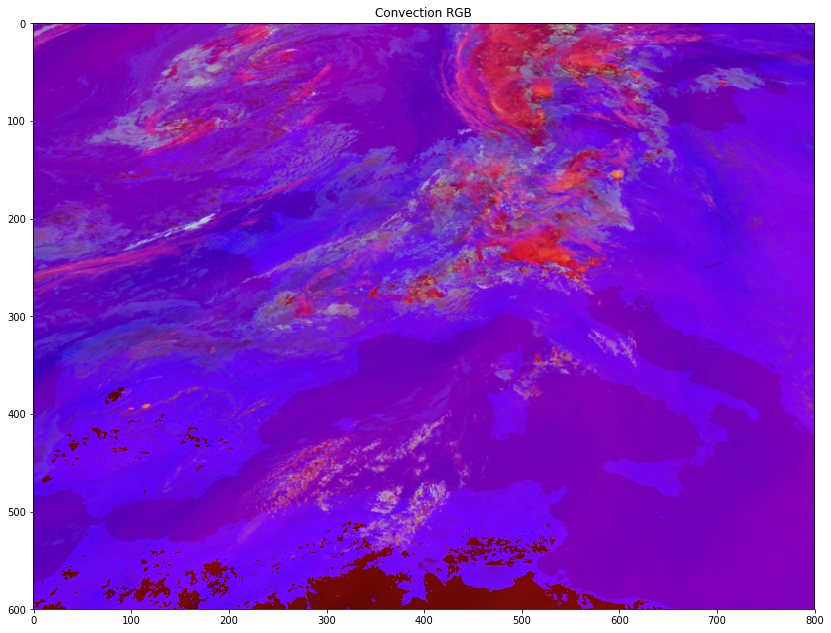

In [34]:
fig,ax=plt.subplots(1,1,figsize=(14,12))
ax.imshow(cc_rgb)
ax.set_title("Convection RGB")

Das könnte für die Segmentierung funktionieren, aber die Kontraste sind ziemlich kein. Vielleicht sieht ein Komposit aus den Quotienten besser aus?

Text(0.5,1,'Convection RGG aus Quotienten')

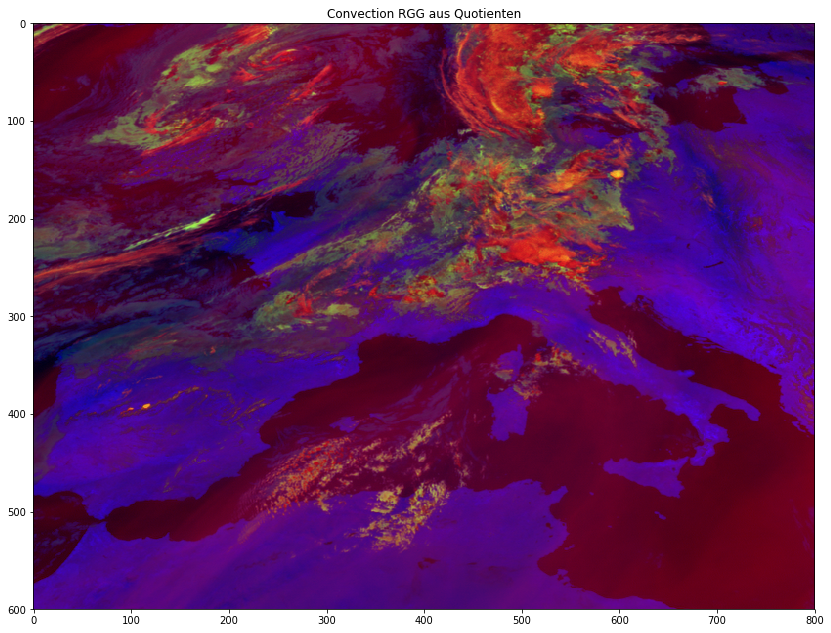

In [35]:
fig,ax=plt.subplots(1,1,figsize=(14,12))
ax.imshow(ccd_rgb)
ax.set_title("Convection RGG aus Quotienten")

Das sieht besser aus. Die Kontraste sind höher. Vielleicht ist ein Komposit aus normalisierten Differenzen auch nützlich. 

Text(0.5,1,'Convection RGB aus normalisierten Differenzen')

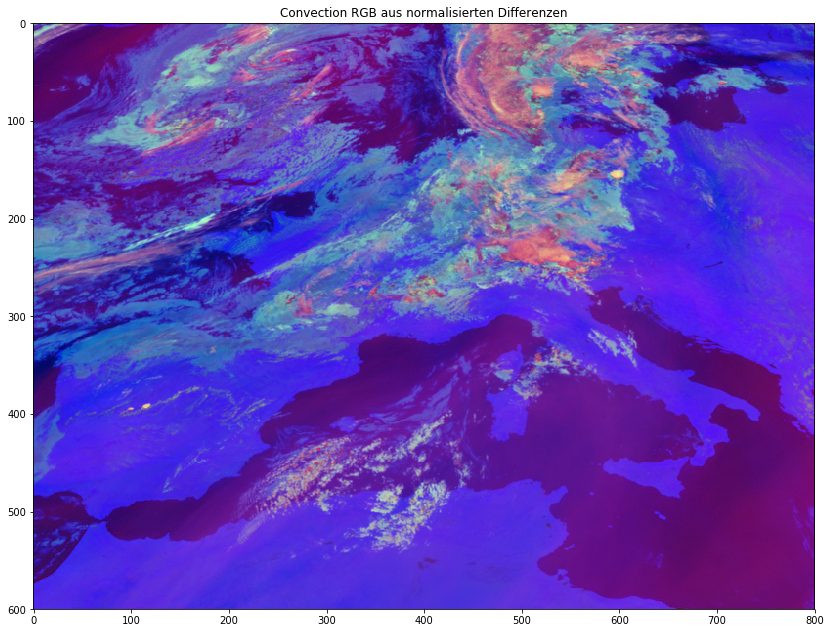

In [36]:
fig,ax=plt.subplots(1,1,figsize=(14,12))
ax.imshow(nccd_rgb)
ax.set_title("Convection RGB aus normalisierten Differenzen")

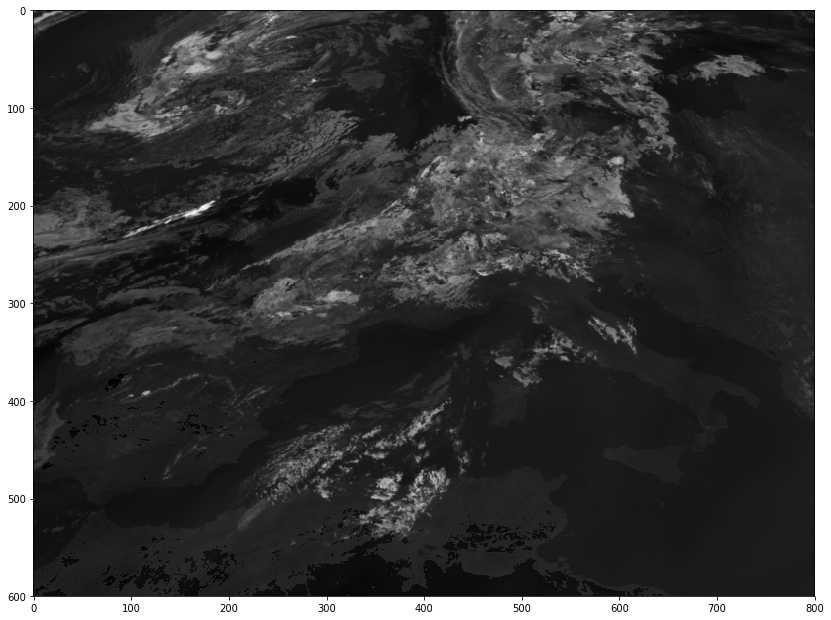

In [38]:
from skimage import color
gray = color.rgb2gray(cc_rgb)

fig,ax=plt.subplots(1,1,figsize=(14,12))
ax.imshow(gray,cmap='gray')

Text(0.5,1,u'Blau-Gelb-Parameter, b')

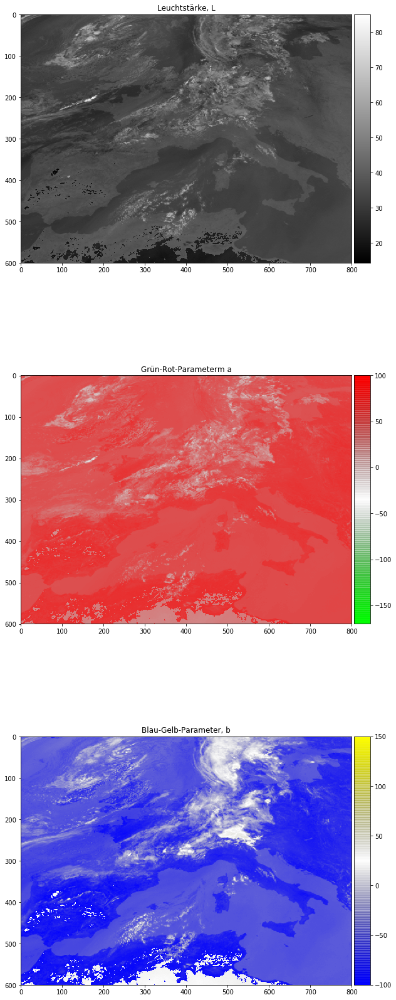

In [39]:
from skimage import color
from matplotlib.colors import LinearSegmentedColormap

gn_rd_colours = [(0, 1, 0, 1), (0.3, 0.3, 0.3, 0), (1, 0, 0, 1)]  # green -> white -> red
cmap_name = 'GnRd'
GnRd = LinearSegmentedColormap.from_list(
        cmap_name, gn_rd_colours, N=270)

bu_yl_colours = [(0, 0, 1, 1), (0.3, 0.3, 0.3, 0), (1, 1, 0, 1)]  # blue -> white -> yellow
cmap_name = 'BuYl'
BuYl = LinearSegmentedColormap.from_list(
        cmap_name, bu_yl_colours, N=250)

lab = color.rgb2lab(cc_rgb)
fig,ax = plt.subplots(3,1,figsize=(10,30))
l_plot = ax[0].imshow(lab[:,:,0],cmap='gray')
colorbar(l_plot)
ax[0].set_title(u'Leuchtstärke, L')
a_plot = ax[1].imshow(lab[:,:,1],cmap=GnRd,vmin=-170,vmax=100)
colorbar(a_plot) 
ax[1].set_title(u'Grün-Rot-Parameterm a')
b_plot = ax[2].imshow(lab[:,:,2],cmap=BuYl,vmin=-100,vmax=150)
colorbar(b_plot)  
ax[2].set_title(u'Blau-Gelb-Parameter, b')

Es sieht so aus, als könnte man konvektive Wolken über einen hohe Luminanz (hoher Albedo) mit hohen Gelbanteil (= hoher Eisanteil) und einen gleichzeitig Rotanteil um 0 (relativ hohe Feuchtigkeit über hohen Wolken) segmentieren.

Text(0.5,1,'b')

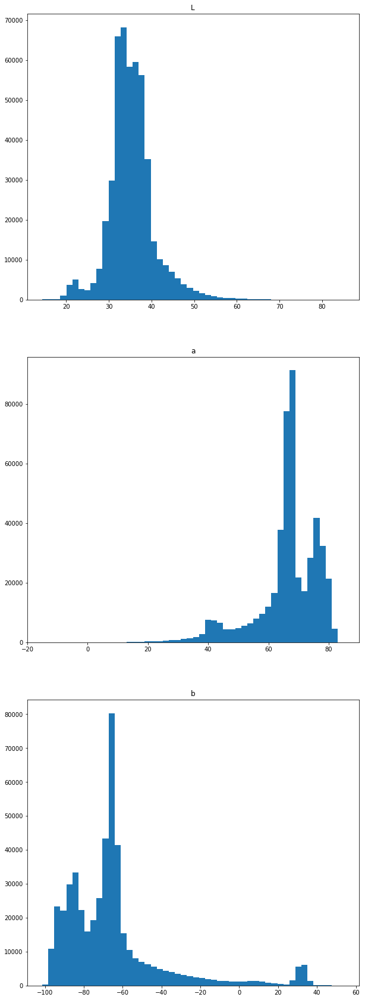

In [40]:
fig,ax = plt.subplots(3,1,figsize=(10,30))
ax[0].hist(lab[:,:,0].ravel(),bins=50)
ax[0].set_title("L")
ax[1].hist(lab[:,:,1].ravel(),bins=50)
ax[1].set_title("a")
ax[2].hist(lab[:,:,2].ravel(),bins=50)
ax[2].set_title("b")

In [46]:
bright_clouds = np.ma.masked_less(lab[:,:,0],np.percentile(lab[:,:,0].flatten(),99))
high_red = np.ma.masked_outside(lab[:,:,1],30,50)
high_yellow = np.ma.masked_outside(lab[:,:,1],30,50)
convective_cloud_mask = (~bright_clouds.mask*1 + ~high_yellow.mask*1 + ~high_red.mask*1).astype(np.uint8)

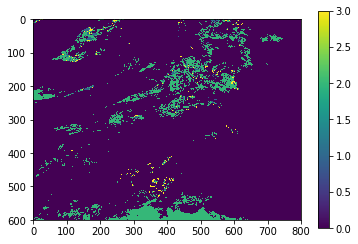

In [47]:
plt.imshow(convective_cloud_mask)
plt.colorbar()

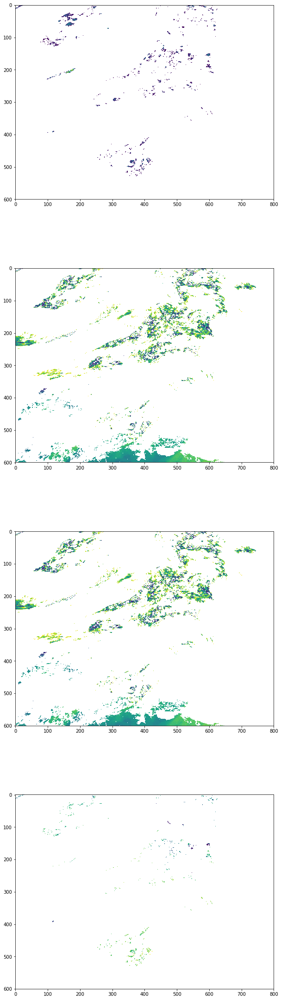

In [48]:
fig,ax = plt.subplots(4,1,figsize=(10,40))
ax[0].imshow(bright_clouds)
ax[1].imshow(high_red)
ax[2].imshow(high_yellow)
ax[3].imshow(np.ma.masked_where(convective_cloud_mask!=3,ir108_data))

In [175]:
np.percentile(lab[:,:,1].flatten(),99)

64.9591219723286

In [211]:
from skimage.segmentation import (morphological_chan_vese,
                                  morphological_geodesic_active_contour,
                                  inverse_gaussian_gradient,
                                  checkerboard_level_set,quickshift,
                                  mark_boundaries,
                                  felzenszwalb,slic)

In [214]:
img = rgb
segments_quick = quickshift(img, kernel_size=6, max_dist=10, ratio=0.5)
segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
segments_slic = slic(img, n_segments=250, compactness=10, sigma=1)

Text(0.5,1,'SLIC')

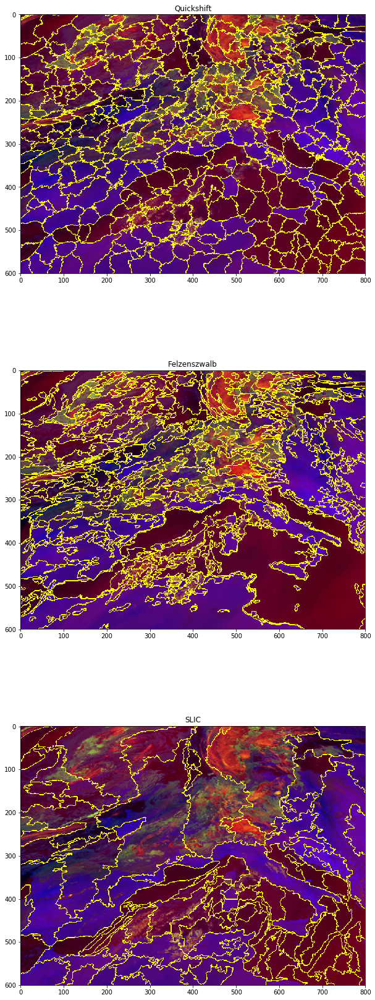

In [215]:
fig,ax = plt.subplots(3,1,figsize=(10,30))
ax[0].imshow(mark_boundaries(img,segments_quick))
ax[0].set_title("Quickshift")
ax[1].imshow(mark_boundaries(img,segments_fz))
ax[1].set_title("Felzenszwalb")
ax[2].imshow(mark_boundaries(img,segments_slic))
ax[2].set_title("SLIC")

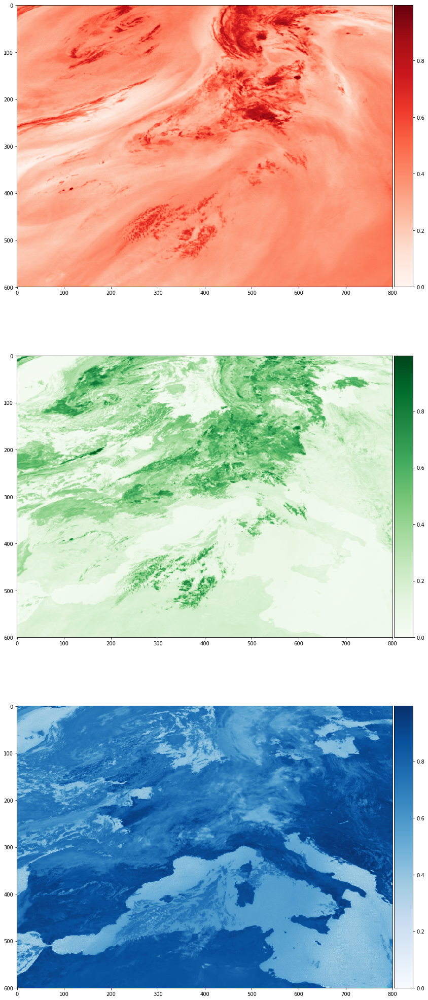

In [91]:
fig,ax = plt.subplots(3,1,figsize=(14,36))
div0_plot = ax[0].imshow(nccd_rgb[:,:,0]/256.,cmap='Reds')
colorbar(div0_plot)
div1_plot = ax[1].imshow(nccd_rgb[:,:,1]/256.,cmap='Greens')
colorbar(div1_plot)
div2_plot = ax[2].imshow(nccd_rgb[:,:,2]/256.,cmap='Blues')
colorbar(div2_plot)

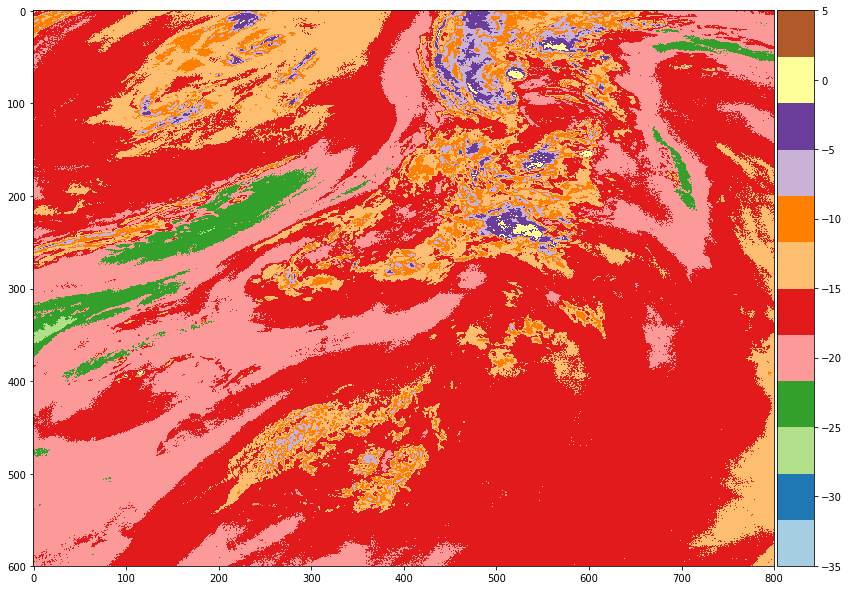

In [32]:
fig,ax = plt.subplots(1,1,figsize=(14,12))
wv_plot = ax.imshow(wv062_data-wv073_data,vmin=-35,vmax=5,cmap='Paired')
colorbar(wv_plot)

Ein Versuch mit spektralem Clustering.

In [33]:
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering

In [35]:
mask = np.ma.masked_less(cma,2)

In [36]:
mask

masked_array(
  data=[[2.0, 2.0, 2.0, ..., 2.0, 2.0, --],
        [2.0, 3.0, 3.0, ..., 2.0, 2.0, 2.0],
        [2.0, 2.0, 3.0, ..., 2.0, 2.0, 2.0],
        ...,
        [--, --, --, ..., 2.0, 2.0, 2.0],
        [--, --, --, ..., 2.0, 2.0, 2.0],
        [--, --, --, ..., 2.0, 2.0, 2.0]],
  mask=[[False, False, False, ..., False, False,  True],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False]],
  fill_value=1e+20,
  dtype=float32)

In [41]:
graph = image.img_to_graph(ir108_data, mask=np.ma.masked_greater(cma,1).mask)
graph.data = np.exp(-graph.data/graph.data.std())

In [43]:
graph

<233900x233900 sparse matrix of type '<type 'numpy.float64'>'
	with 1114230 stored elements in COOrdinate format>

In [44]:
#labels = spectral_clustering(graph, n_clusters=ndi.label(ir_marker)[1], eigen_solver='arpack')

KeyboardInterrupt: 

In [ ]:
#fig,ax = plt.subplots(1,1,figisize=(14,12))
#ax.imshow(ir108_data,vmin=210,vmax=300,cmap='gray_r')
#ax.imshow(labels,alpha=0.4)

In [40]:
ndi.label(ir_marker)[1]

15

Noch ein Versuch mit einer Random-Walker-Segmentierung.

In [46]:
from skimage.segmentation import random_walker

In [79]:
labels_ws = watershed(-ir108_quant + np.max(ir108_quant), ndi.label(ir_mins)[0], mask=np.ma.masked_greater(ir108_quant,3).mask)

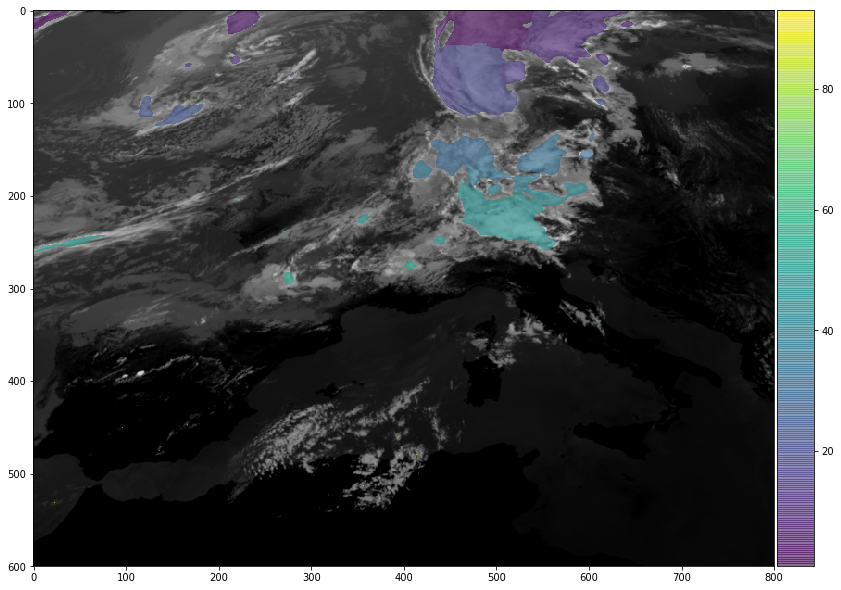

In [81]:
fig,ax = plt.subplots(1,1,figsize=(14,12))
ax.imshow(ir108_data,vmin=210,vmax=300,cmap='gray_r')
lab_plot = ax.imshow(np.ma.masked_less(labels_ws,1),alpha=0.6)
colorbar(lab_plot)

Das sieht schon ganz gut aus. Ab er vielleicht ist eine dynamische Maske besser. Dazu nehmen wir den Wert des Markers aus dem quantisierten Feld und berechnen einen bestimmte Tiefe, bis zu der segmentiert wird.

In [ ]:
def create_segmentation_mask(base_field,markers):
    marker_values = base_field[np.where(markers!=0)]

In [72]:
base_field = ir108_quant
markers = ir_mins

In [73]:
marker_values = base_field[np.where(markers!=0)]

In [74]:
marker_values.shape

(93,)